# **Visión computacional para imágenes y video**
## **Maestría en Inteligencia Artificial Aplicada**
### **Dr. Gilberto Ochoa Ruiz**
### **Tecnológico de Monterrey**
## **9.6/10.5 Algoritmos de Segmentación - Superpixels**

---

### Equipo 37

- Jorge Luis Ancheyta Segovia - A01796354
- Omar Aguilar Macedo - A01797078


In [1]:
#@title Setup

!pip install ipympl --quiet # interacción en imanges

# para collab necesitamos reiniciar el ambiente una vez que se instalo ipympl
# para que funcione la directiva %matplotlib ipympl y poder agregar interactividad
# puede ser con la opción de Runtime -> Restart Session o con código
# podemos descomentar las siguientes líneas:

try:
  %matplotlib ipympl
  print('ipympl backend está disponible')
except:
  print('reiniciando sesión para intentar activar ipympl')
  import os
  os.kill(os.getpid(), 9)


ipympl backend está disponible


In [2]:
# Habilitar widgets third party
from google.colab import output
output.enable_custom_widget_manager()

In [3]:
# @title Liberías
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.segmentation import slic, mark_boundaries
from skimage.util import img_as_float

import ipywidgets as widgets
from IPython.display import display, clear_output

import cv2
from skimage.segmentation import slic, quickshift, mark_boundaries, felzenszwalb
from skimage import color


In [4]:
# @title Utilis

def read_image(image_path):
  img = cv2.imread(image_path, cv2.IMREAD_COLOR)
  return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def convert_rgb_to_lab(rgb_img, as_float = True):
    lab = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2LAB)
    if as_float:
      return lab.astype(np.float32)
    return lab

def read_images(image_paths):
  images = {}
  for title, path in image_paths.items():
    images[title] = read_image(path)
  return images


In [5]:
# @title Imagenes de Ejemplo

lib_images = {
    "Astronauta": img_as_float(data.astronaut()),
    "Gato"      : img_as_float(data.cat()),
}

custom_images_paths = {
    "Dogs"    : "data/dogs.jpg",
    "Espacio" : "data/espacio.png",
    "Flower"  : "data/flower_bw.jpg",
    "Lizard"  : "data/lizard.jpg",
    "Lunetas" : "data/lunetas.jpg",
    "Mapa"    : 'data/map.jpg',
    "Placa"   : "data/placa.jpg",
    "Rabbit"  : "data/rabbit.jpg",
}

custom_images = read_images(custom_images_paths)

all_images = custom_images | lib_images

def get_synthetic_images():
  H, W = 256, 256

  # Bimodal
  img1 = np.zeros((H,W), np.uint8)
  cv2.circle(img1, (W//2, H//2), 70, 180, -1)

  # Iluminación desigual
  x = np.linspace(0, 1, W, dtype=np.float32)
  grad = (x[None,:]*120).astype(np.float32)
  obj = cv2.GaussianBlur((img1>0).astype(np.float32)*120, (51,51), 0)
  img2 = (grad + obj).clip(0,255).astype(np.uint8)

  # Textura con ruido
  rng = np.random.default_rng(0)
  img3 = (rng.normal(110, 25, size=(H,W))).clip(0,255).astype(np.uint8)
  cv2.rectangle(img3, (60,60), (200,200), 180, -1)
  mask3 = np.zeros_like(img3, np.uint8)
  mask3[60:200, 60:200] = 1

  return [img1, img2, img3]

syn_images = get_synthetic_images()


In [6]:
# @title código super pixels
def superpixels_slic(image, n_segments=400, compactness=10, sigma=1):
    """
    SLIC de scikit-image.
    Devuelve:
      - labels: mapa de etiquetas de superpíxeles
      - overlay: imagen con bordes de superpíxeles dibujados
    """
    img = img_as_float(image)
    segments = slic(
        img,
        n_segments=n_segments,
        compactness=compactness,
        sigma=sigma,
        start_label=0,
    )
    overlay = mark_boundaries(img, segments)
    return segments, overlay


def superpixels_quickshift(image, kernel_size=3, max_dist=6, ratio=0.5):
    """
    Quickshift de scikit-image.
    """
    img = img_as_float(image)
    segments = quickshift(
        img,
        kernel_size=kernel_size,
        max_dist=max_dist,
        ratio=ratio
    )
    # Relabel para que las etiquetas sean 0..N-1
    unique_labels, relabeled = np.unique(segments, return_inverse=True)
    segments_relabeled = relabeled.reshape(segments.shape)
    overlay = mark_boundaries(img, segments_relabeled)
    return segments_relabeled, overlay


def superpixels_lsc(image, region_size=20, ratio=0.075, num_iterations=10):
    """
    LSC de OpenCV (cv2.ximgproc.createSuperpixelLSC).
    """
    img = img_as_float(image)

    # aplicamos blur para suavizar la imagen
    img = cv2.GaussianBlur(img, (3, 3), 0)

    # OpenCV trabaja en BGR uint8
    if img.ndim == 2:
        img_rgb = np.stack([img, img, img], axis=-1)
    else:
        img_rgb = img
    img_bgr = cv2.cvtColor((img_rgb * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)

    lsc = cv2.ximgproc.createSuperpixelLSC(
        img_bgr,
        region_size=region_size,
        ratio=ratio
    )
    lsc.iterate(num_iterations)

    labels = lsc.getLabels()  # shape (H, W)
    # Máscara de contornos (1: contorno de SP, 0: interior)
    contour_mask = lsc.getLabelContourMask(thick_line=False)

    # Crear overlay: oscurecemos contornos
    overlay_bgr = img_bgr.copy()
    overlay_bgr[contour_mask == 255] = [0, 255, 255]  # bordes en amarillo (BGR)
    overlay_rgb = cv2.cvtColor(overlay_bgr, cv2.COLOR_BGR2RGB) / 255.0

    return labels, overlay_rgb

def superpixels_felzenszwalb(image, scale=100, sigma=0.8, min_size=50):
    """
    Felzenszwalb

    Parámetros:
      - scale: controla el tamaño de las regiones (más grande crea superpíxeles más grandes).
      - sigma: suavizado previo con gaussiano.
      - min_size: tamaño mínimo de cada región (en píxeles).

    Devuelve:
      - labels: mapa de etiquetas de superpíxeles (shape HxW)
      - overlay: imagen con bordes de superpíxeles dibujados
    """
    img = img_as_float(image)

    segments = felzenszwalb(
        img,
        scale=scale,
        sigma=sigma,
        min_size=min_size
    )

    overlay = mark_boundaries(img, segments)
    return segments, overlay


def compute_superpixels(image, method="slic", **kwargs):
    """
    Wrapper para elegir algoritmo:
      - method = 'slic'
      - method = 'quickshift'
      - method = 'lsc'
      - method = 'fz'
    """
    method = method.lower()
    if method == "slic":
        return superpixels_slic(image, **kwargs)
    elif method == "quickshift":
        return superpixels_quickshift(image, **kwargs)
    elif method == "lsc":
        return superpixels_lsc(image, **kwargs)
    elif method in ("felzenszwalb", "fz"):
        return superpixels_felzenszwalb(image, **kwargs)
    else:
        raise ValueError(f"Método no soportado: {method}")


In [7]:
# los siguientes bloques no necesitan interactividad
%matplotlib inline

In [8]:
# @title playground
def draw_single_image_multiple_methods(img):
  methods = [
      ("SLIC"        , "slic"      , { "n_segments": 300, "compactness": 10 }),
      ("Quickshift"  , "quickshift", { "kernel_size": 5, "max_dist": 10, "ratio": 0.5}),
      ("LSC (OpenCV)", "lsc"       , { "region_size": 30, "ratio": 0.075, "num_iterations": 10 }),
      ("Felzenszwalb", "fz"        , { "scale": 100, "min_size": 100, "sigma": 0.8 }),
  ]

  fig, axes = plt.subplots(1, len(methods), figsize=(4 * len(methods), 4), constrained_layout=True)

  for ax, (title, method_name, params) in zip(axes, methods):
      labels, overlay = compute_superpixels(img, method=method_name, **params)
      ax.imshow(overlay)
      ax.set_title(f"{title}, segments: {len(np.unique(labels))}")
      ax.axis("off")

  plt.show()

# draw_single_image_multiple_methods(img_as_float(data.coffee()))

In [9]:
# @title Simple Demo Utils
# draw a single image, original vs algorithm with different params
def draw_single_image(img, method_name, params, figsize=(8, 4)):
  plt.figure(figsize=figsize)
  labels, overlay = compute_superpixels(img, method=method_name, **params)
  n_segments = np.unique(labels).shape[0]
  plt.subplot(1, 2, 1); plt.title(f'Original ({img.shape[0]}x{img.shape[1]}), Pixeles: {img.size}'); plt.imshow(img); plt.axis('off');
  plt.subplot(1, 2, 2); plt.title(f'Segmentada: {method_name}, Segmentos: {n_segments}'); plt.imshow(overlay); plt.axis('off');
  plt.tight_layout()

def draw_multiple_images(images, method_name, params, figsize=(8, 4)):
  plt.figure(figsize=figsize)
  rows = len(images)
  for idx, img in enumerate(images):
    labels, overlay = compute_superpixels(img, method=method_name, **params)
    n_segments = np.unique(labels).shape[0]
    n_pixels = img.shape[0] * img.shape[1]
    plt.subplot(rows, 2, idx * 2 + 1); plt.title(f'Original ({img.shape[0]}x{img.shape[1]}), Pixeles: {n_pixels}'); plt.imshow(img); plt.axis('off');
    plt.subplot(rows, 2, idx * 2 + 2); plt.title(f'Segmentada: {method_name}, Segmentos: {n_segments}'); plt.imshow(overlay); plt.axis('off');
  plt.tight_layout()



## ¿Qué son los superpíxeles?


Es un conjunto de píxeles contiguos que tienen características similares, por ejemplo, color, brillo o textura, y que juntos representan una región más coherente de la imagen.

El objetivo del superpíxel es reemplazar la estructura rígida de la cuadrícula de píxeles por entidades visualmente significativas que forman una partición coherente.

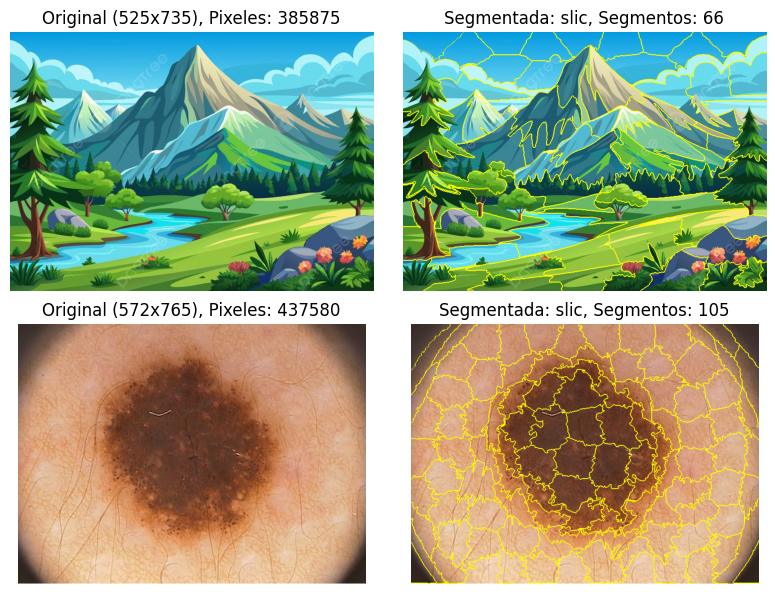

In [10]:
draw_multiple_images(
  [read_image('data/paisaje.jpg'), read_image('data/IMD042.jpg')],
  'slic', { "n_segments": 100, "compactness": 10 }, figsize=(8,6)
)

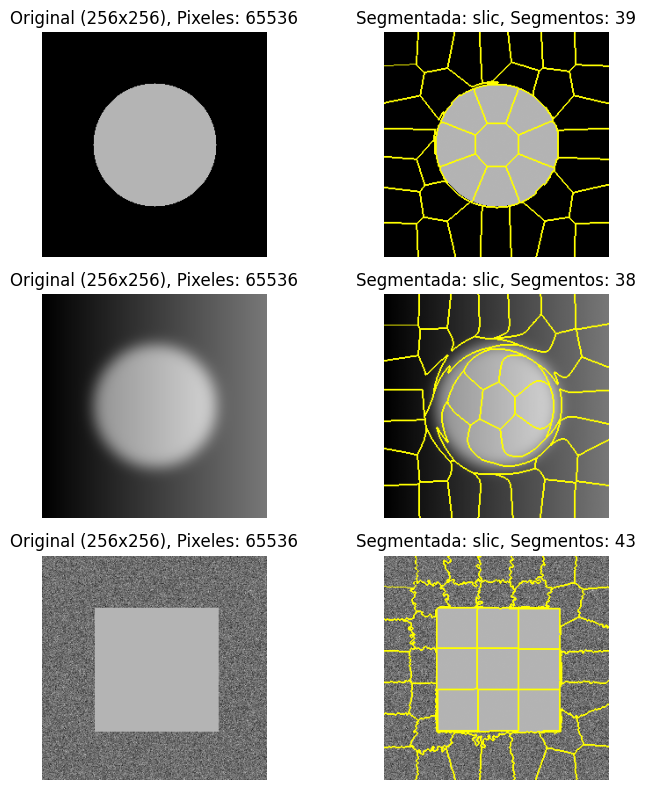

In [11]:
draw_multiple_images(
  [cv2.cvtColor(syn_img, cv2.COLOR_GRAY2RGB) for syn_img in syn_images],
  'slic', { "n_segments": 50, "compactness": 10 }, figsize=(8,8)
)

## Galería visual de superpíxeles

In [12]:
# @title Utils de Galeria
# Se ejecuta el mismo algoritmo 3 veces sobre cada imagen con diferentes parametros
# Despues se genera una imagen combinando los 3 resultados separados por diagonales

slic_params = [
    { "n_segments": 50,  "compactness": 10 },
    { "n_segments": 150, "compactness": 10 },
    { "n_segments": 300, "compactness": 10 },
]

quickshift_params = [
    { "kernel_size": 8, "max_dist": 17, "ratio": 0.8},
    { "kernel_size": 6, "max_dist": 12, "ratio": 0.6},
    { "kernel_size": 5, "max_dist": 10, "ratio": 0.5}
]

lsc_params = [
    { "region_size": 60, "ratio": 0.075, "num_iterations": 10 },
    { "region_size": 42, "ratio": 0.075, "num_iterations": 10 },
    { "region_size": 30, "ratio": 0.075, "num_iterations": 10 }
]

fz_params = [
    { "scale": 350, "min_size": 250, "sigma": 0.8 },
    { "scale": 200, "min_size": 150, "sigma": 0.8 },
    { "scale": 100, "min_size": 100, "sigma": 0.8 }
]

methods = [
    ("SLIC"        , "slic"      , slic_params),
    # ("Quickshift"  , "quickshift", quickshift_params),
    ("LSC (OpenCV)", "lsc"       , lsc_params),
    ("Felzenszwalb", "fz"        , fz_params),
]

def diagonal_comparison_sharp(original_img, imgs, method, labels, figsize=(12, 8)):
    """
    original_img: imagen original
    imgs: lista de imágenes RGB de mismo tamaño
    title: titulo del plot
    labels: lista con el número de segmentos
    """
    h, w, _ = imgs[0].shape
    n = len(imgs)
    X, Y = np.meshgrid(np.arange(w), np.arange(h))
    ratio = X / w + Y / h
    thresholds = np.linspace(0, 2, n + 1)
    composite = np.zeros_like(imgs[0])

    for i in range(n):
        mask = (ratio >= thresholds[i]) & (ratio < thresholds[i+1])
        composite[mask] = imgs[i][mask]

    # Líneas divisorias
    for t in thresholds[1:-1]:
        line_mask = np.abs(ratio - t) < 0.005
        composite[line_mask] = [1, 0, 0]  # rojo

    plt.figure(figsize=figsize)

    # Imagen original
    img = original_img
    n_pixels = img.shape[0] * img.shape[1]
    title = f'Original ({img.shape[0]}x{img.shape[1]}), Pixeles: {n_pixels}'
    plt.subplot(1, 2, 1); plt.title(title); plt.imshow(original_img); plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(composite)
    plt.axis("off")
    for i, label in enumerate(labels):
        y = int((i + 0.5) * h / n)
        x = int((i + 0.5) * w / n)
        plt.text(x, y, label, color='white', fontsize=14,
                 ha='center', va='center',
                 bbox=dict(facecolor='black', alpha=0.5, boxstyle='round'))
    plt.title(f"Comparación {method}")
    plt.show()

def color_superpixels(labels, image_rgb, kind = 'avg'):
  return color.label2rgb(labels, image_rgb, alpha=1, kind=kind)

def save_gallery_image(image_name, img):
  file_path = f'processed/galeria/{image_name}.jpg'
  # print(file_path)
  # cv2.imwrite(f'galeria/{image_name}', img)

def save_gallery_labels(image_name, labels):
  file_path = f'processed/galeria/{image_name}.npy'
  # print(file_path)
  # np.save(file_path, labels)

def draw_diagonals_experiment(original_img, segmented_images, figsize=(12, 8)):
  method   = segmented_images[0][1]
  segments = [n for _,_,n in segmented_images]
  imgs     = [img for img, _, _ in segmented_images]
  diagonal_comparison_sharp(original_img, imgs, method, [f"{n} segments" for n in segments], figsize=figsize)

def draw_multi_params_experiment(original_img, segmented_images, figsize=(16, 3)):
    plt.figure(figsize=figsize)

    # Imagen original
    img = original_img
    n_pixels = img.shape[0] * img.shape[1]
    title = f'Original ({img.shape[0]}x{img.shape[1]}), Pixeles: {n_pixels}'
    plt.subplot(1, 4, 1); plt.title(title); plt.imshow(original_img)

    # Imagenes segmentadas
    for idx, img_data in enumerate(segmented_images):
      img, method, n_segments = img_data
      title = f'Segmentada: {method}, Segs: {n_segments}'
      plt.subplot(1, 4,  idx + 2); plt.title(title); plt.imshow(img); plt.axis('off')

    # plt.tight_layout()

def create_super_pixels_gallery(img, img_idx, methods):
    base_image_name = f'{img_idx:02d}'
    save_gallery_image(f"{base_image_name}_original", img)

    for config_idx, config in enumerate(methods):
      title, method, all_params = config
      segmented_images = []

      for params_idx, params in enumerate(all_params):
        labels, overlay = compute_superpixels(img, method=method, **params)
        n_segments = np.unique(labels).shape[0]
        base_image_name_processed = f'{base_image_name}_{config_idx:02d}_{params_idx:02d}_{n_segments:03d}_{method}'
        save_gallery_image(f"{base_image_name_processed}_overlay", overlay)
        save_gallery_labels(f"{base_image_name_processed}_labels", labels)
        segmented_images.append((overlay, method, n_segments))

      draw_multi_params_experiment(img, segmented_images)
      # draw_diagonals_experiment(img, segmented_images)
      # yield (img, segmented_images)

      # superpixels_average = color_superpixels(labels, img, 'avg')
      # superpixels_colored = color_superpixels(labels, img, 'overlay')
      # save_gallery_image(f"{base_image_name_processed}_average")
      # save_gallery_image(f"{base_image_name_processed}_colors")



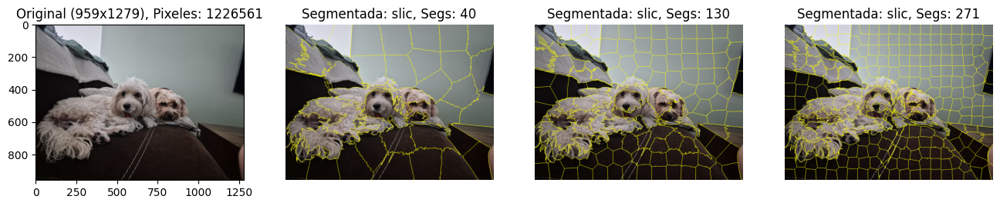

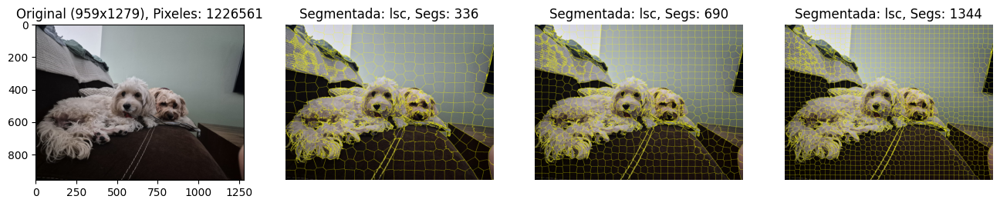

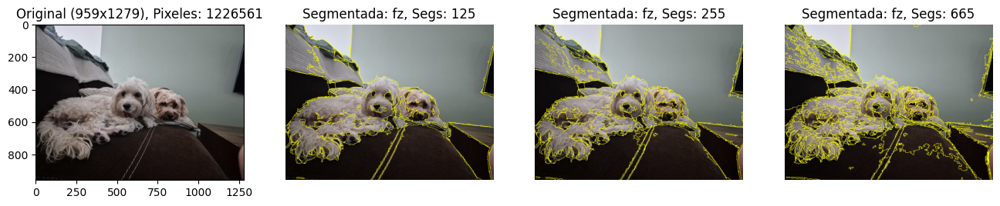

In [13]:
# @title Dogs
create_super_pixels_gallery(all_images['Dogs'], 0, methods)

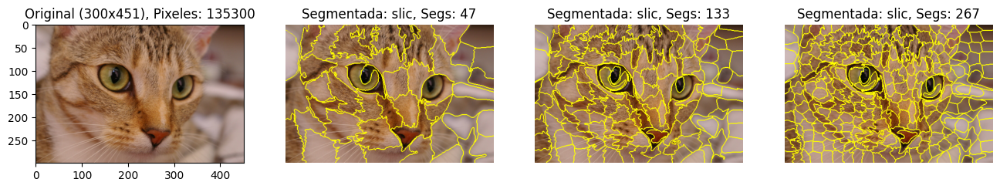

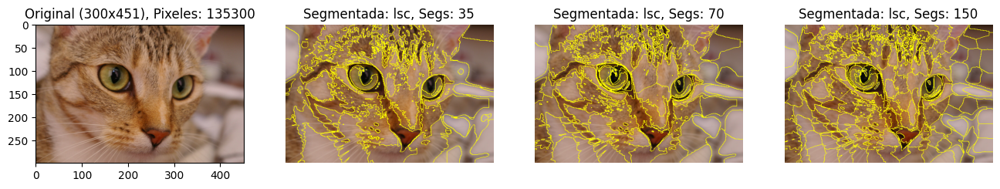

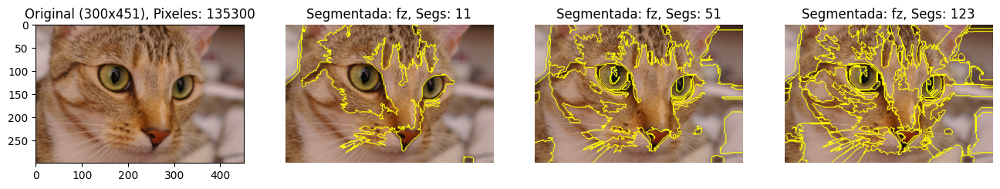

In [14]:
# @title Gato
create_super_pixels_gallery(all_images['Gato'], 0, methods)

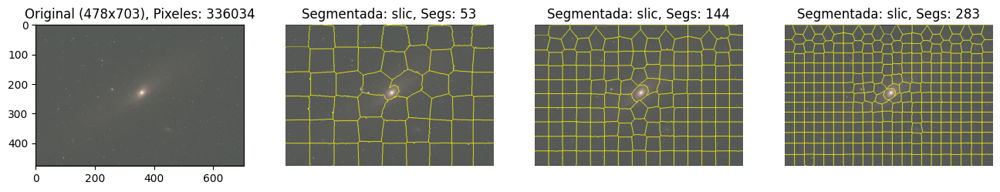

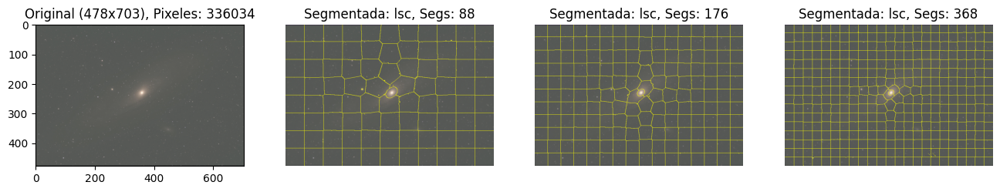

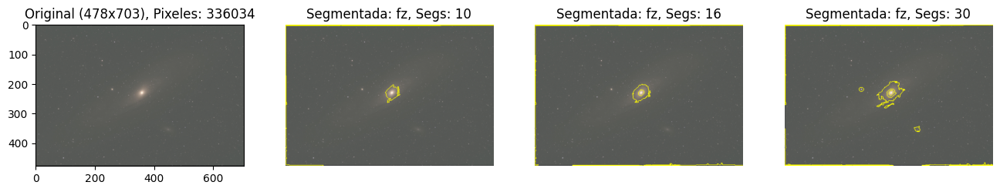

In [15]:
# @title Espacio
create_super_pixels_gallery(all_images['Espacio'], 0, methods)


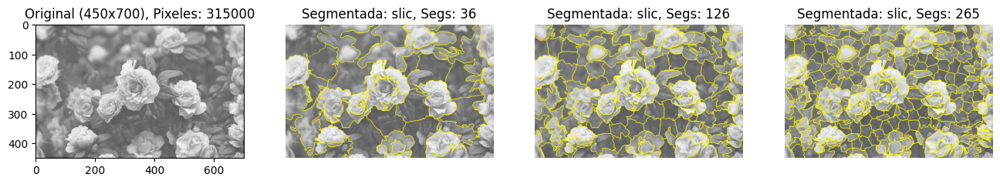

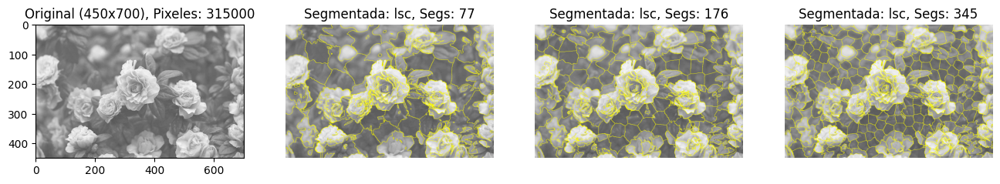

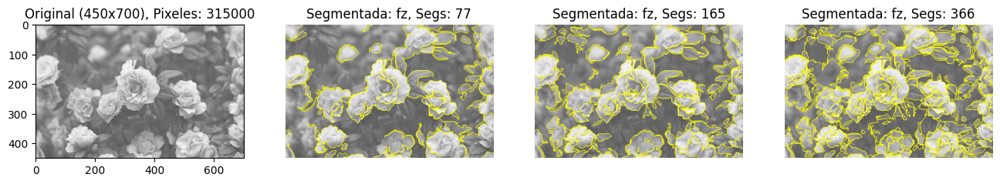

In [16]:
# @title Flower
create_super_pixels_gallery(all_images['Flower'], 0, methods)

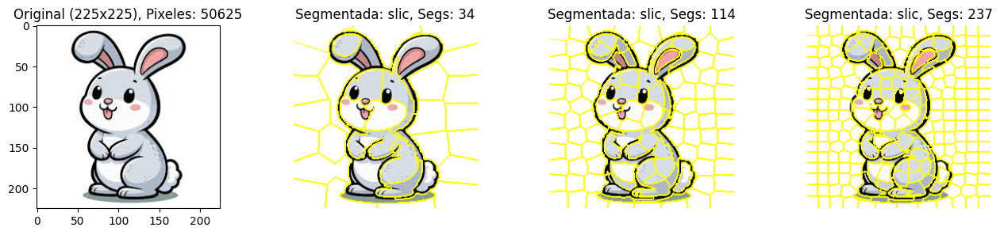

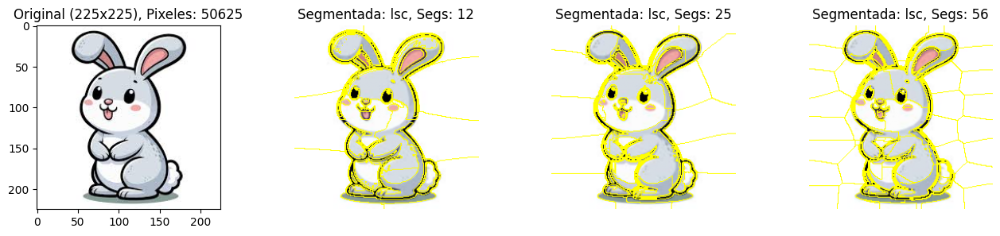

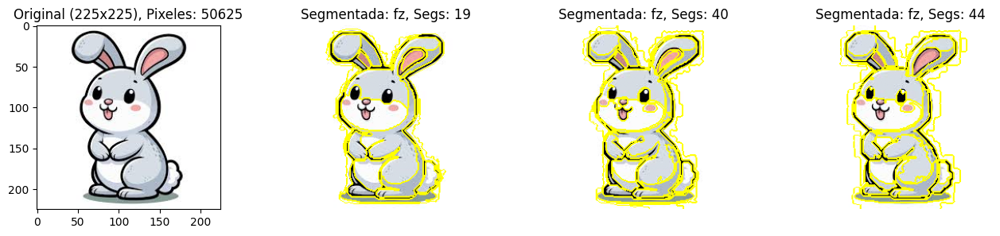

In [17]:
# @title Rabbit
create_super_pixels_gallery(all_images['Rabbit'], 0, methods)

## Playground SLIC

In [18]:
# @title imports playground
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.segmentation import slic, mark_boundaries
from skimage.util import img_as_float

import ipywidgets as widgets
from IPython.display import display, clear_output

In [19]:
# Habilitamos el plot interactivo para las siguientes celdas
%matplotlib ipympl

In [20]:
#@title Widgets y sus eventos

images = None

# Estado global para compartir entre callbacks
current_state = {
    "image_name": None,
    "image": None,
    "segments": None,
    "fig": None,
    "ax_orig": None,
    "ax_seg": None,
    "click_cid": None,  # id del callback de click
}

def on_click(event):
    """
    Callback cuando el usuario hace clicl en la figura.
    Destaca el superpíxel correspondiente en la imagen de la derecha.
    """
    # Solo reaccionar si el click fue en el eje derecho (ax_seg)
    if current_state["ax_seg"] is None or event.inaxes != current_state["ax_seg"]:
        return

    if event.xdata is None or event.ydata is None:
        return

    x = int(event.xdata)
    y = int(event.ydata)

    segments = current_state["segments"]
    image = current_state["image"]

    if segments is None or image is None:
        return

    if y < 0 or y >= segments.shape[0] or x < 0 or x >= segments.shape[1]:
        return

    label = segments[y, x]
    mask = (segments == label)

    # Creamos una imagen resaltando solo ese superpíxel
    #  - Lo dentro del SP se queda igual
    #  - Lo demás lo oscurecemos
    img = image.copy()
    if img.ndim == 2:  # grayscale → expandimos a 3 canales para manipular fácil
        img_rgb = np.stack([img, img, img], axis=-1)
    else:
        img_rgb = img.copy()

    dim_factor = 0.1
    dimmed = img_rgb * dim_factor

    # Aplicamos el "oscurecido" solo fuera del superpíxel
    highlighted = dimmed.copy()
    highlighted[mask] = img_rgb[mask]

    ax_seg = current_state["ax_seg"]
    ax_seg.clear()
    ax_seg.set_title(f"Superpíxel #{label} (tamaño: {mask.sum()} px)")
    ax_seg.imshow(highlighted)
    ax_seg.axis("off")

    current_state["fig"].canvas.draw_idle()


def run_slic_and_plot(image_name, n_segments, compactness, sigma):
    """
    Ejecuta SLIC sobre la imagen seleccionada y dibuja:
      - Izquierda: imagen original
      - Derecha: bordes de superpíxeles
    También conecta el callback de click.
    """

    img = all_images[image_name]

    # SLIC espera imagen float [0,1], manejamos grayscale o RGB
    if img.ndim == 2:
        img_float = img_as_float(img)
    else:
        img_float = img_as_float(img)

    segments = slic(
        img_float,
        n_segments=int(n_segments),
        compactness=float(compactness),
        sigma=float(sigma),
        start_label=0,
    )

    # Limpiamos figura anterior si existe
    if current_state["fig"] is not None:
        try:
            if current_state["click_cid"] is not None:
                current_state["fig"].canvas.mpl_disconnect(current_state["click_cid"])
            plt.close(current_state['fig'])
        except Exception:
            pass

    fig, axes = plt.subplots(1, 2, figsize=(8, 4), constrained_layout=True)

    # Imagen original
    ax0 = axes[0]
    ax0.imshow(img, cmap="gray" if img.ndim == 2 else None)
    ax0.set_title(f"Original: {image_name}")
    ax0.axis("off")

    # Imagen con bordes de superpíxeles
    ax1 = axes[1]
    ax1.imshow(mark_boundaries(img_float, segments))
    ax1.set_title("Superpíxeles (clic para resaltar uno)")
    ax1.axis("off")

    # Guardamos estado
    current_state["image_name"] = image_name
    current_state["image"] = img_float
    current_state["segments"] = segments
    current_state["fig"] = fig
    current_state["ax_orig"] = ax0
    current_state["ax_seg"] = ax1

    # Conectamos callback de clic
    click_cid = fig.canvas.mpl_connect("button_press_event", on_click)
    current_state["click_cid"] = click_cid

    plt.show(fig)

In [21]:
#@title Ejemplo interactivo SLIC
# Creamos los widget de interactividad
image_dropdown = widgets.Dropdown(
    options=list(all_images.keys()),
    value="Astronauta",
    description="Imagen:",
)

n_segments_slider = widgets.IntSlider(
    value=50,
    min=50,
    max=1000,
    step=50,
    description="n_segments",
    continuous_update=False,
)

compactness_slider = widgets.FloatSlider(
    value=10.0,
    min=0.1,
    max=30.0,
    step=0.5,
    description="compactness",
    continuous_update=False,
)

sigma_slider = widgets.FloatSlider(
    value=1.0,
    min=0.0,
    max=5.0,
    step=0.5,
    description="sigma",
    continuous_update=False,
)

run_button = widgets.Button(
    description="Aplicar SLIC",
    button_style="primary",
)

out = widgets.Output()


def update_plot(_=None):
    with out:
        clear_output(wait=True)
        run_slic_and_plot(
            image_name=image_dropdown.value,
            n_segments=n_segments_slider.value,
            compactness=compactness_slider.value,
            sigma=sigma_slider.value,
        )

run_button.on_click(update_plot)

# actualizar automáticamente al mover sliders:
for w in [image_dropdown, n_segments_slider, compactness_slider, sigma_slider]:
    w.observe(update_plot, names="value")

# Layout
controls = widgets.VBox([
    image_dropdown,
    n_segments_slider,
    compactness_slider,
    sigma_slider,
    run_button,
])

display(widgets.HBox([controls, out]))

update_plot()

## SLIC "manual" (timelapse de iteraciones)

In [22]:
# Quitamos interacción para las siguientes celdas
%matplotlib inline

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def slic_collect_frames(
    image_path,
    num_segments=200,
    m=10,
    num_iter=10
):
    bgr = cv2.imread(image_path)
    if bgr is None:
        raise ValueError(f"No pude leer la imagen: {image_path}")

    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB).astype(np.float32)

    h, w = lab.shape[:2]
    N = h * w
    S = int(np.sqrt(N / float(num_segments)) + 0.5)
    S = max(S, 1)

    centers = []
    for y in range(S // 2, h, S):
        for x in range(S // 2, w, S):
            L, a, b = lab[y, x]
            centers.append([y, x, L, a, b])
    centers = np.array(centers, dtype=np.float32)
    K = centers.shape[0]

    # Gradiente para ajustar centros
    gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY).astype(np.float32)
    gx = cv2.Sobel(gray, cv2.CV_32F, 1, 0, ksize=3)
    gy = cv2.Sobel(gray, cv2.CV_32F, 0, 1, ksize=3)
    grad = gx**2 + gy**2

    for k in range(K):
        y, x = int(centers[k, 0]), int(centers[k, 1])
        y0, y1 = max(0, y - 1), min(h - 1, y + 1)
        x0, x1 = max(0, x - 1), min(w - 1, x + 1)
        patch = grad[y0:y1+1, x0:x1+1]
        idx = int(np.argmin(patch))
        dy, dx = divmod(idx, patch.shape[1])
        ny, nx = y0 + dy, x0 + dx
        L, a, b = lab[ny, nx]
        centers[k] = [ny, nx, L, a, b]

    labels = -1 * np.ones((h, w), dtype=np.int32)
    dists = np.full((h, w), np.inf, dtype=np.float32)

    rng = np.random.default_rng(0)
    sp_colors = rng.integers(0, 255, size=(K, 3), dtype=np.uint8)

    def compute_boundaries(labels):
        h, w = labels.shape
        boundaries = np.zeros((h, w), dtype=bool)
        boundaries[:-1, :] |= labels[:-1, :] != labels[1:, :]
        boundaries[:, :-1] |= labels[:, :-1] != labels[:, 1:]
        return boundaries

    def make_frame(it = None, num_iter = None):

        frame = rgb.copy()
        color_img = np.zeros_like(frame)

        for k in range(K):
            mask = (labels == k)
            if np.any(mask):
                color_img[mask] = sp_colors[k]

        if np.any(labels >= 0):
            alpha = 0.6
            mask_any = labels >= 0
            frame[mask_any] = (
                alpha * color_img[mask_any] +
                (1 - alpha) * frame[mask_any]
            ).astype(np.uint8)

            boundaries = compute_boundaries(labels)
            frame[boundaries] = [0, 0, 0]

        for k in range(K):
            y, x = int(centers[k, 0]), int(centers[k, 1])
            if 0 <= x < w and 0 <= y < h:
                frame[y-1:y+2, x-1:x+2] = [255, 0, 0]

        return frame

    def enforce_connectivity(labels):
        """Fuerza la conectividad de los superpíxeles"""
        h, w = labels.shape
        new_labels = labels.copy()
        label = 0

        dx4 = [-1, 0, 1, 0]
        dy4 = [0, -1, 0, 1]

        visited = np.zeros((h, w), dtype=bool)
        n_segments = np.max(labels) + 1
        print(n_segments)
        min_size = (h * w) // (n_segments * 4)

        for i in range(h):
            for j in range(w):
                if not visited[i, j]:
                    # BFS para encontrar componente conectada
                    stack = [(i, j)]
                    component = []
                    old_label = labels[i, j]

                    while stack:
                        ci, cj = stack.pop()
                        if visited[ci, cj]:
                            continue

                        visited[ci, cj] = True
                        component.append((ci, cj))

                        for d in range(4):
                            ni, nj = ci + dx4[d], cj + dy4[d]
                            if (0 <= ni < h and 0 <= nj < w and
                                not visited[ni, nj] and labels[ni, nj] == old_label):
                                stack.append((ni, nj))

                    # Si componente es muy pequeña, asignar a vecino
                    if len(component) < min_size:
                        # Buscar vecino más común
                        neighbor_labels = []
                        for ci, cj in component:
                            for d in range(4):
                                ni, nj = ci + dx4[d], cj + dy4[d]
                                if 0 <= ni < h and 0 <= nj < w:
                                    neighbor_labels.append(new_labels[ni, nj])

                        if neighbor_labels:
                            most_common = max(set(neighbor_labels), key=neighbor_labels.count)
                            for ci, cj in component:
                                new_labels[ci, cj] = most_common
                    else:
                        for ci, cj in component:
                            new_labels[ci, cj] = label
                        label += 1

        return new_labels

    frames = []
    frames.append(make_frame())

    ys_all, xs_all = np.indices((h, w))

    for it in range(1, num_iter + 1):
        dists.fill(np.inf)

        for k in range(K):
            yk, xk, Lk, ak, bk = centers[k]
            y0 = max(int(yk - S), 0)
            y1 = min(int(yk + S), h)
            x0 = max(int(xk - S), 0)
            x1 = min(int(xk + S), w)
            if y0 >= y1 or x0 >= x1:
                continue

            sub_lab = lab[y0:y1, x0:x1]
            dL = sub_lab[..., 0] - Lk
            da = sub_lab[..., 1] - ak
            db = sub_lab[..., 2] - bk
            dc2 = dL*dL + da*da + db*db

            xs, ys = np.meshgrid(
                np.arange(x0, x1),
                np.arange(y0, y1)
            )
            ds2 = (xs - xk)**2 + (ys - yk)**2

            D = np.sqrt(dc2 / (m*m) + ds2 / (S*S))

            sub_d = dists[y0:y1, x0:x1]
            sub_l = labels[y0:y1, x0:x1]

            mask = D < sub_d
            sub_d[mask] = D[mask]
            sub_l[mask] = k

        # Recalcular centros
        new_centers = np.zeros_like(centers)

        for k in range(K):
            mask = (labels == k)
            if not np.any(mask):
                new_centers[k] = centers[k]
                continue
            y_mean = ys_all[mask].mean()
            x_mean = xs_all[mask].mean()
            L_mean, a_mean, b_mean = lab[mask].mean(axis=0)
            new_centers[k] = [y_mean, x_mean, L_mean, a_mean, b_mean]

        centers = new_centers
        frames.append(make_frame(it, num_iter))

    return frames


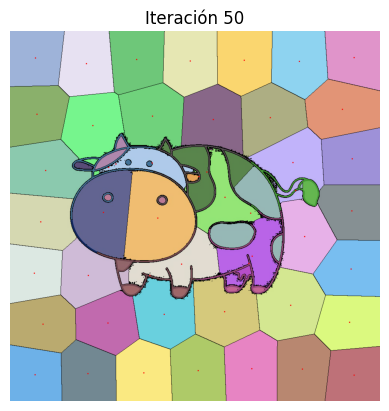

In [24]:
# @title iteraciones slic
frames = slic_collect_frames("data/cow.jpg", num_segments=50, m=15, num_iter=50)
plt.close()
fig, ax = plt.subplots()
ax.axis("off")
im = ax.imshow(frames[0])

def update(i):
    im.set_data(frames[i])
    ax.set_title(f"Iteración {i}")
    return [im]

ani = FuncAnimation(fig, update, frames=len(frames), interval=500, blit=True)
HTML(ani.to_jshtml())

## Aplicación Médica - Superpixels en imagenes de Cáncer de Piel


In [25]:
#@title Download Dataset from Kaggle
import os, zipfile, pathlib

!chmod 600 /content/kaggle.json

os.environ["KAGGLE_CONFIG_DIR"] = "/content"
!kaggle datasets download -d spacesurfer/ph2-dataset -p /content/ph2

# descomprimir
zip_path = "/content/ph2/ph2-dataset.zip"
with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall("/content/ph2/data")

base_dir = pathlib.Path("/content/ph2/data")
list(base_dir.rglob("*"))[:10]  # para inspeccionar estructura

Dataset URL: https://www.kaggle.com/datasets/spacesurfer/ph2-dataset
License(s): other
ph2-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


[PosixPath('/content/ph2/data/PH2Dataset'),
 PosixPath('/content/ph2/data/PH2Dataset/Readme.txt'),
 PosixPath('/content/ph2/data/PH2Dataset/PH2_dataset.xlsx'),
 PosixPath('/content/ph2/data/PH2Dataset/PH2_dataset.txt'),
 PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images'),
 PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images/IMD389'),
 PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images/IMD120'),
 PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images/IMD080'),
 PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images/IMD144'),
 PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images/IMD088')]

In [26]:
# @title validar contenido de dataset
from pathlib import Path
import cv2
import numpy as np
import matplotlib.pyplot as plt

base_root = Path("/content/ph2/data")  # ajusta si tu unzip fue a otra carpeta
base_dir = base_root / "PH2Dataset" / "PH2 Dataset images"

print("Base_dir:", base_dir)
print("Ejemplos de carpetas IMDXXX:")
for p in sorted(base_dir.iterdir())[:5]:
    print("  ", p)

Base_dir: /content/ph2/data/PH2Dataset/PH2 Dataset images
Ejemplos de carpetas IMDXXX:
   /content/ph2/data/PH2Dataset/PH2 Dataset images/IMD002
   /content/ph2/data/PH2Dataset/PH2 Dataset images/IMD003
   /content/ph2/data/PH2Dataset/PH2 Dataset images/IMD004
   /content/ph2/data/PH2Dataset/PH2 Dataset images/IMD006
   /content/ph2/data/PH2Dataset/PH2 Dataset images/IMD008


In [27]:
# @title Lectura de imágenes
pairs = []

for case_dir in sorted(base_dir.iterdir()):
    if not case_dir.is_dir():
        continue

    case_id = case_dir.name  # IMD001, IMD002, etc.

    dermo_dir  = case_dir / f"{case_id}_Dermoscopic_Image"
    lesion_dir = case_dir / f"{case_id}_lesion"
    img_path = dermo_dir / f"{case_id}.bmp"

    mask_path = lesion_dir / f"{case_id}_lesion.bmp"
    if img_path.exists() and mask_path is not None:
        pairs.append((img_path, mask_path))
    else:
        print("Saltando caso por falta de archivo:", case_dir)

print("Total de pares válidos:", len(pairs))
pairs[:3]

Total de pares válidos: 200


[(PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images/IMD002/IMD002_Dermoscopic_Image/IMD002.bmp'),
  PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images/IMD002/IMD002_lesion/IMD002_lesion.bmp')),
 (PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images/IMD003/IMD003_Dermoscopic_Image/IMD003.bmp'),
  PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images/IMD003/IMD003_lesion/IMD003_lesion.bmp')),
 (PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images/IMD004/IMD004_Dermoscopic_Image/IMD004.bmp'),
  PosixPath('/content/ph2/data/PH2Dataset/PH2 Dataset images/IMD004/IMD004_lesion/IMD004_lesion.bmp'))]

Ejemplo imagen: /content/ph2/data/PH2Dataset/PH2 Dataset images/IMD002/IMD002_Dermoscopic_Image/IMD002.bmp
Ejemplo máscara: /content/ph2/data/PH2Dataset/PH2 Dataset images/IMD002/IMD002_lesion/IMD002_lesion.bmp


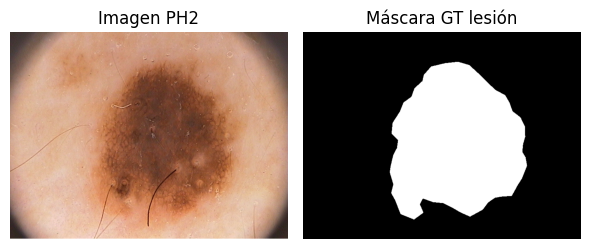

In [28]:
# @title Ejemplo de Imagen
img_path, mask_path = pairs[0]
print("Ejemplo imagen:", img_path)
print("Ejemplo máscara:", mask_path)

img_bgr = cv2.imread(str(img_path))
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
mask_bin = (mask > 0).astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(6, 4))
axes[0].imshow(img_rgb)
axes[0].set_title("Imagen PH2")
axes[0].axis("off")

axes[1].imshow(mask_bin, cmap="gray")
axes[1].set_title("Máscara GT lesión")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [29]:
# @title Caso de uso imports

from skimage.segmentation import find_boundaries
from skimage.segmentation import slic
from skimage.util import img_as_float
from skimage import color
from skimage.filters import sobel
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

In [30]:
# @title Utils

def dice_coefficient(y_true, y_pred):
    y_true = y_true.astype(bool)
    y_pred = y_pred.astype(bool)
    inter = np.logical_and(y_true, y_pred).sum()
    return 2 * inter / (y_true.sum() + y_pred.sum() + 1e-8)

def iou(y_true, y_pred):
    y_true = y_true.astype(bool)
    y_pred = y_pred.astype(bool)
    inter = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return inter / (union + 1e-8)

def overlay_mask_on_image(image, mask, color=(1.0, 0.0, 0.0), alpha=0.4):
    if image.dtype != np.float32 and image.dtype != np.float64:
        img = image.astype(np.float32) / 255.0
    else:
        img = image.copy()

    mask_bool = mask.astype(bool)
    overlay = img.copy()

    # color del overlay en forma de array
    color_arr = np.array(color).reshape(1, 1, 3)

    # aplicar mezcla solo en los píxeles donde la máscara es 1
    overlay[mask_bool] = (
        (1 - alpha) * img[mask_bool] + alpha * color_arr
    )

    return np.clip(overlay, 0, 1)

def overlay_mask_border(image, mask, color=(1.0, 1.0, 0.0), thickness=1):
    """
    Dibuja solo el borde de la máscara sobre la imagen.
    thickness: por ahora 1, si quieres más gordito podemos engrosarlo con dilatación.
    """
    if image.dtype != np.float32 and image.dtype != np.float64:
        img = image.astype(np.float32) / 255.0
    else:
        img = image.copy()

    # encontrar bordes de la región True/1
    boundaries = find_boundaries(mask.astype(bool), mode='outer')

    img_border = img.copy()
    color_arr = np.array(color).reshape(1, 1, 3)

    # pintar sólo los píxeles de borde
    img_border[boundaries] = color_arr

    return np.clip(img_border, 0, 1)


In [31]:
# @title Caso de Uso

def add_to_status(text, status):
  status.value = status.value + f"<span style='color: light-gray'>{text}</span><br/>"

def analyze_image(img_data, status):
  # --- Tomamos un caso de ejemplo ---
  img_path, mask_path = img_data
  add_to_status(f"Analizando imagen {img_path}", status)

  img_bgr = cv2.imread(str(img_path))
  img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
  image = img_as_float(img_rgb)

  mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
  mask_bin = (mask > 0).astype(np.uint8)

  h, w = mask_bin.shape

  # --- SLIC ---
  segments = slic(
      image,
      n_segments=300,
      compactness=10.0,
      sigma=1.0,
      start_label=0
  )

  num_sp = segments.max() + 1
  add_to_status(f"Superpixeles: {num_sp}", status)

  # plt.figure(figsize=(5, 5))
  # plt.imshow(segments, cmap="nipy_spectral")
  # plt.title("Mapa de superpixeles (SLIC)")
  # plt.axis("off")
  # plt.show()

  # --- Features por superpixel ---
  edges = sobel(color.rgb2gray(image))

  features = []
  labels_sp = []

  for sp_id in range(num_sp):
      sp_mask = (segments == sp_id)
      if not np.any(sp_mask):
          continue

      region_pixels = image[sp_mask]
      region_edges  = edges[sp_mask]

      mean_r, mean_g, mean_b = region_pixels.mean(axis=0)
      std_int   = region_pixels.std()
      mean_edge = region_edges.mean()

      ys, xs = np.where(sp_mask)
      y_mean = ys.mean() / h
      x_mean = xs.mean() / w

      feat_vec = [mean_r, mean_g, mean_b, std_int, mean_edge, x_mean, y_mean]
      features.append(feat_vec)

      overlap = mask_bin[sp_mask].mean()
      label = 1 if overlap > 0.3 else 0   # 30% de píxeles de lesión
      labels_sp.append(label)

  features = np.array(features)
  labels_sp = np.array(labels_sp)

  add_to_status(f"Shape features: {features.shape}", status)
  add_to_status(f"Superpixeles lesion/no-lesion: {np.bincount(labels_sp)}", status)

  # --- Clasificador ---
  X_train, X_test, y_train, y_test = train_test_split(
      features, labels_sp,
      test_size=0.3,
      stratify=labels_sp,
      random_state=42
  )

  clf = RandomForestClassifier(
      n_estimators=200,
      max_depth=None,
      class_weight="balanced",
      random_state=42
  )
  clf.fit(X_train, y_train)
  add_to_status(f"Acc (superpixel-level) test: {clf.score(X_test, y_test)}", status)

  # --- Reconstruir máscara ---
  y_pred_sp = clf.predict(features)

  mask_pred = np.zeros_like(mask_bin, dtype=np.uint8)
  sp_idx = 0
  for sp_id in range(num_sp):
      sp_mask = (segments == sp_id)
      if not np.any(sp_mask):
          continue
      mask_pred[sp_mask] = y_pred_sp[sp_idx]
      sp_idx += 1

  add_to_status(f"Dice: {dice_coefficient(mask_bin, mask_pred)}", status)
  add_to_status(f"IoU : {iou(mask_bin, mask_pred)}", status)
  return (image, mask_bin, mask_pred, segments)


def draw_medical_experiment(image, mask_bin, mask_pred, labels, figsize=(6, 8)):
  colored_labels = color_superpixels(labels, image, 'overlay')
  overlay_mask_pred = overlay_mask_border(image, mask_pred, color=(0.0, 0.0, 1.0))
  overlay_mask_bin = overlay_mask_border(image, mask_bin, color=(0.0, 0.0, 1.0))

  plt.figure(figsize=figsize)

  plt.subplot(3, 2, 1); plt.title('Original'); plt.imshow(image); plt.axis('off')
  plt.subplot(3, 2, 2); plt.title(f'Super pixels overlay segs: {np.max(labels) + 1}'); plt.imshow(colored_labels); plt.axis('off')
  plt.subplot(3, 2, 3); plt.title('Lesión'); plt.imshow(mask_bin, cmap="gray"); plt.axis('off')
  plt.subplot(3, 2, 4); plt.title('Predicción (SLIC + RF)'); plt.imshow(mask_pred, cmap='gray'); plt.axis('off')
  plt.subplot(3, 2, 5); plt.title('Overlay Lesión'); plt.imshow(overlay_mask_bin); plt.axis('off')
  plt.subplot(3, 2, 6); plt.title('Overlay Predicción'); plt.imshow(overlay_mask_pred); plt.axis('off')

  plt.tight_layout()
  plt.show()
  plt.close()



In [32]:
# Habilitamos el plot interactivo para las siguientes celdas
%matplotlib ipympl

In [33]:
# @title Dropdown con imágenes médicas
import matplotlib.pyplot as plt
from ipywidgets import Dropdown, Output, HTML
from skimage.io import imread
from skimage.segmentation import slic, mark_boundaries
import os

images = {}

# creamos las opciones del dropwdown con nuestro dataset
for pair in pairs:
    img_path, mask_path = pair
    if os.path.exists(img_path):
      file_name_with_extension = os.path.basename(img_path)
      file_name_without_extension = os.path.splitext(file_name_with_extension)[0]
      images[file_name_without_extension] = pair

# lista de imagenes
dropdown = Dropdown(
    options=list(images.keys()),
    description="Imagen:",
    value=list(images.keys())[0],
    style={'description_width': 'initial'}
)

# Log
status = HTML()
# área de gráficos
out = Output()


def on_select(change):
    with out:
        out.clear_output(wait=True)
        status.value = ""

        # Cargar imagen seleccionada
        key = change["new"]
        img_data = images[key]
        results = analyze_image(img_data, status)
        draw_medical_experiment(*results)


# Escuchar eventos
dropdown.observe(on_select, names="value")

# UI
display(dropdown, status, out)

# Ejecutar una vez al inicio
on_select({"new": dropdown.value})


Dropdown(description='Imagen:', options=('IMD002', 'IMD003', 'IMD004', 'IMD006', 'IMD008', 'IMD009', 'IMD010',…

HTML(value='')

Output()